<a href="https://colab.research.google.com/github/JairamSubhash/Bulldozer_Auction_Price_Prediction/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end multi-class dog breed classfication

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifyng the breed of a dog given an image of a dog.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition :
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaulation is a file with prediction probabilities for each dog breed of each test image

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some info about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs(this means there are 120 different classes).
* There are around 10000+ images in training set (these images have labels)
* There are around 10000+ images in test set (these images have no labels, becz we'll want to predict them)



In [ ]:
# Unzip the uploaded data into Google Drive

# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification (1) latest2.zip" -d "/content/drive/MyDrive"

### Get our Workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

# SHORTCUT
Ctrl+Shift+Space = DOCSTRING

In [ ]:
# Import Necessary Tools

import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__)
print("TF Hub version:",hub.__version__)

# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available : (")

TF version: 2.12.0
TF Hub version: 0.14.0
GPU available


## Getting our data ready (turning into Tensors)

With all ML Models, our data has to be in numerical format. So that's what  we'll be doing first. Turning our images into Tensors(numerical representations.)

Let's start by accessing our data and checking out the labels.

In [ ]:
# checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

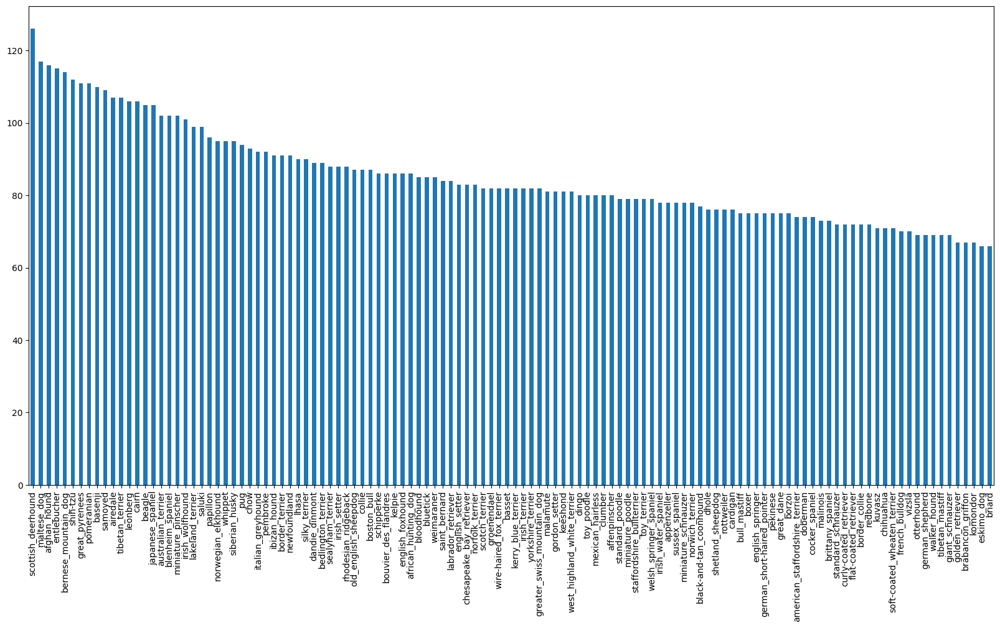

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
labels_csv.breed.value_counts().median()

82.0

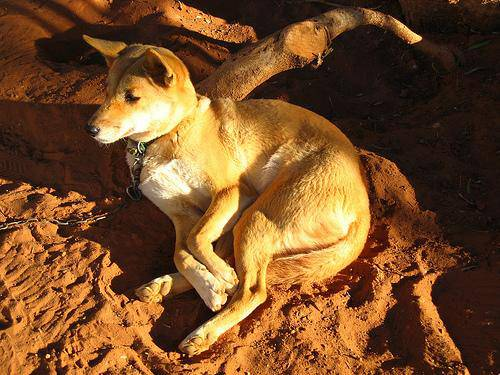

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv.id]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/MyDrive/Dog Vision/train")[:10]

['e78fc6d10f9d4646a50004e4ac74ea5c.jpg',
 'e05e54a99b170e04cd266a8e90aedb1e.jpg',
 'e139e3a836bd9c57af5355847b8eb805.jpg',
 'e0acf08c678ede145c9824dbb7c3718e.jpg',
 'e78ff6b0a2d3a58234760d45e984eccf.jpg',
 'dfc726ff7000561805073a11d0d64178.jpg',
 'e1af6b48fbc089b3704ee26ade7b4f6c.jpg',
 'e7a8a3681524405b2e987ffbaff6d173.jpg',
 'e2b39eb9cb8b34303cc3527f8f8df9d6.jpg',
 'e97344d98c999f4f9bfa5dc33ca09ecb.jpg']

In [ ]:
# Check whether no. of filenames matches no. of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames don't match, check the target directory")

Filenames match actual amount of files!!! Proceed.


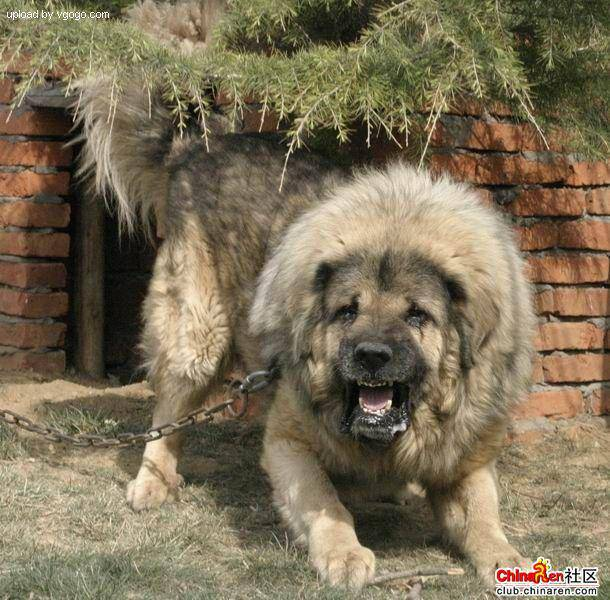

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv.breed[9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv.breed.to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if no. of labels matches the no. of filenames
if len(labels) == len(filenames):
  print("No. of labels matches no. of filenames!")
else:
  print("No. of labels doesn't match no. of filenames, check data directories!")

No. of labels matches no. of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(labels)

10222

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
from pandas.core.arrays import boolean
# Example : Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2]) # original label
print(boolean_labels[2].astype(int)) # there will be a 1 where the sample label occurs


pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X and y variables
X = filenames # variable for data - filepaths to images
y = boolean_labels # variable for label - boolean numpy representations of the labels

In [ ]:
len(filenames)

10222

We 're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set no. of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

In [ ]:
# Let;s have a gaze at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

### Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like:

In [ ]:
 # Convert an image to NumPy array
from matplotlib.pyplot import imread #image read
image = imread(filenames[42])
image.shape
# gives height, width, colour

(257, 350, 3)

In [ ]:
# Gives pixel values
image.max(), image.min()

(255, 0)

In [ ]:
# Image in NumPy array
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# Turned image into Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our iamage (convert colour channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing image
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value(224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
# Trying out
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
# Trying out
tf.image.decode_jpeg(tensor, channels=3)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

## Turning out data into batches

Why turn our data into batches?

Let's say you are trying to process 10k+ images in one go... they all might not into memory.

So that's why we do about 32 (batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuple which look like this:
`(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label)
  """
  image=process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image,label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batch of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
     print("Creating test data batches...")
    #  Turn filenames into Tensor Dataset
     data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    #  Creating data batch by mapping image function
     data_batch = data.map(process_image).batch(BATCH_SIZE)
     return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data =  tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand, let's visualize them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax=plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lnes off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[9.96078491e-01, 9.92156923e-01, 9.72549081e-01],
          [9.96078491e-01, 9.92156923e-01, 9.72549081e-01],
          [9.96078491e-01, 9.92156923e-01, 9.72549081e-01],
          ...,
          [8.52783680e-01, 8.44940543e-01, 7.93960154e-01],
          [8.59064579e-01, 8.51221442e-01, 8.00241053e-01],
          [8.55243742e-01, 8.47400606e-01, 7.96420217e-01]],
 
         [[9.96078491e-01, 9.92156923e-01, 9.72549081e-01],
          [9.96078491e-01, 9.92156923e-01, 9.72549081e-01],
          [9.96078491e-01, 9.92156923e-01, 9.72549081e-01],
          ...,
          [8.26391876e-01, 8.18548739e-01, 7.67568350e-01],
          [8.38953018e-01, 8.31109881e-01, 7.80129492e-01],
          [8.37544143e-01, 8.29701006e-01, 7.78720617e-01]],
 
         [[9.96078491e-01, 9.92156923e-01, 9.72549081e-01],
          [9.96078491e-01, 9.92156923e-01, 9.72549081e-01],
          [9.96078491e-01, 9.92156923e-01, 9.72549081e-01],
          ...,
          [8.36430371e-01, 8.28587234e-01, 7.7760

In [ ]:
len(train_images), len(train_labels)

(32, 32)

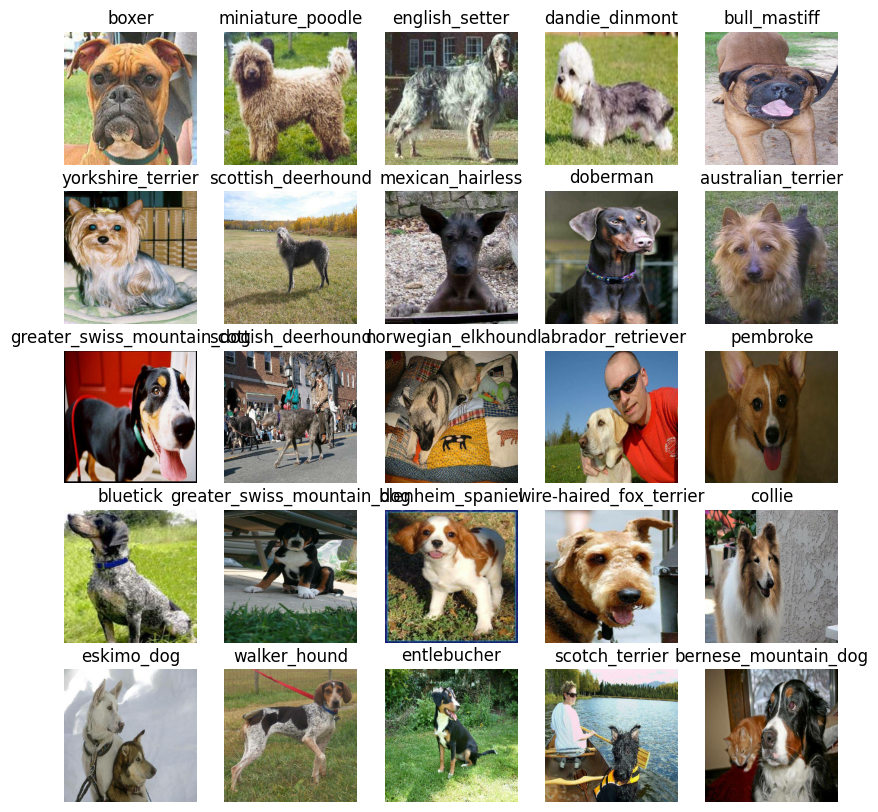

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

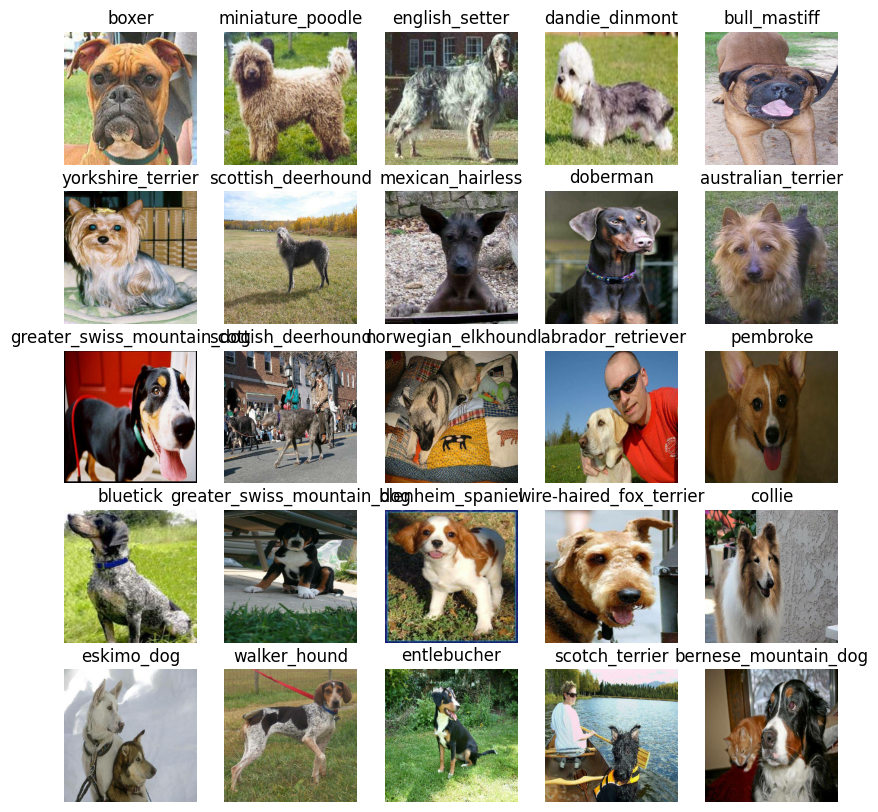

In [ ]:
# Now let's visualize the data in a validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use form TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

# Setup otuput shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got out inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which :
* Takes the input shape, output shape and the model we've chosen as parameter.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved.)
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here : https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  # passing keras sequential model
  model = tf.keras.Sequential([
      # input is image of a dog
      # model url mobilnet v2 finds patterns inside input
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            # we dont want same shape as mobilnet v2, hence we convert it to size of our own output shape
                            # which is the amount of unique labels that we have OUTPUT_SHAPE
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      # at the training set, lower the loss, better the model is learning to match the labels
      # our goal is to minimize loss
      loss = tf.keras.losses.CategoricalCrossentropy(),
      # your friend Adam is helping with instructions based on ur performnace to help you reach down the hill
      # helps model improve its guesses
      optimizer = tf.keras.optimizers.Adam(),
      # the judge predicts how well the model is predicting the correct image label
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper fucntions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create 2 callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `tensorboard` magic funciton (we'll do this after model training)


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # make it so the logs get tracked whenever we run an expt
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping



In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# check to make sure we're still running on a GPU
print("GPU", "available (YESS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!)


Let's create a function which trains a model.

* Create a mdoel using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
##### EPOCHS - how many chances did our model have to pass over the entire training data set to find patterns
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 15s 219ms/step - loss: 4.4863 - accuracy: 0.1138 - val_loss: 3.4663 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 4s 170ms/step - loss: 1.6044 - accuracy: 0.7000 - val_loss: 2.2039 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 3s 123ms/step - loss: 0.5656 - accuracy: 0.9375 - val_loss: 1.6990 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 3s 120ms/step - loss: 0.2536 - accuracy: 0.9875 - val_loss: 1.5243 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1464 - accuracy: 0.9962 - val_loss: 1.4497 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 4s 148ms/step - loss: 0.0993 - accuracy: 1.0000 - val_loss: 1.3891 - val_accuracy: 0.6500
Epoch 7/100
25/25 [=============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.


In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data
# None, 224, 224, 3 -- are images
# None, 120 -- are labels

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used on train on)
# the predict function is only going to look at images in val_data and make predictions on those images,
# and we'll compare those predictions to the actual labels
predictions = model.predict(val_data, verbose=1)
# verbose=1 means it shows the progress
predictions

7/7 [==============================] - 1s 91ms/step


array([[2.4260879e-04, 1.1893416e-04, 4.8519466e-03, ..., 4.1979869e-04,
        1.5962658e-05, 1.8172943e-03],
       [2.3629477e-03, 2.0339017e-04, 1.2506355e-02, ..., 2.0550644e-04,
        1.5441460e-03, 3.6550924e-04],
       [8.8166653e-06, 1.3834081e-04, 2.8050854e-05, ..., 3.4205426e-05,
        1.3540866e-05, 1.3317728e-04],
       ...,
       [4.7748522e-06, 1.1145332e-04, 5.7404970e-05, ..., 1.2627166e-05,
        2.3040452e-04, 5.0679424e-05],
       [1.5516899e-03, 4.0273360e-05, 1.9571220e-05, ..., 3.2098800e-05,
        1.5613183e-05, 5.4281303e-03],
       [9.5051779e-05, 2.0817137e-05, 1.9480856e-04, ..., 2.7464304e-02,
        2.3980574e-04, 1.0122083e-05]], dtype=float32)

In [ ]:
predictions.shape
# So we have 200 arrays of 120 different elements

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# Predictions made on the First image
predictions[0]

array([2.42608789e-04, 1.18934156e-04, 4.85194661e-03, 4.20629040e-05,
       1.33518013e-04, 2.90353296e-06, 3.16369571e-02, 8.66763512e-05,
       4.56225884e-04, 3.90797388e-04, 1.11808462e-04, 5.02802315e-04,
       5.68297284e-04, 2.57354750e-05, 3.33287229e-04, 1.49005602e-04,
       2.00813574e-05, 1.06817730e-01, 2.84741891e-05, 2.62977028e-05,
       6.31792762e-04, 9.74039649e-05, 3.36387711e-05, 3.65977932e-04,
       2.13294334e-05, 1.44299134e-04, 3.19270700e-01, 3.09435505e-04,
       1.33571695e-04, 5.53995604e-04, 1.20523211e-04, 3.38449259e-04,
       1.17175269e-03, 3.74798515e-06, 8.17127875e-05, 1.78488176e-02,
       6.05189016e-05, 2.12588973e-04, 3.94768467e-05, 2.47475091e-05,
       6.92626927e-04, 8.75046535e-05, 4.40624171e-05, 4.00307763e-05,
       1.60062100e-05, 1.12986418e-04, 3.07373593e-05, 1.69158549e-04,
       1.48116771e-04, 8.06176031e-05, 6.49865251e-05, 8.63846708e-06,
       8.17500113e-04, 6.83173639e-05, 2.29770565e-04, 8.85655572e-06,
      

In [ ]:
# The model will find the highest value that corresponds to the index of the actual label is most likely
# And the sum of all these predictions in the array is always close to 1
np.sum(predictions[0])

1.0

In [ ]:
# from pandas.tseries.frequencies import unique
# First prediction
index = 77
print(predictions[index])
print(f"Max Value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted labels: {unique_breeds[np.argmax(predictions[index])]}")


[4.68480494e-03 7.91290586e-06 3.14299068e-05 1.21748373e-04
 1.14540433e-06 1.15465875e-04 7.03469004e-06 3.38050950e-06
 4.09283984e-06 1.92105901e-07 6.25606026e-06 2.34786839e-05
 2.08341044e-06 2.61206333e-06 7.93602624e-07 2.01093258e-07
 3.50789310e-06 3.53859355e-06 5.38823906e-06 9.15824671e-07
 2.75516039e-04 5.01742875e-07 1.41993681e-07 1.12064590e-04
 1.71320535e-05 4.03676313e-06 1.05099299e-03 1.83562661e-04
 1.10205156e-05 1.08132563e-05 1.30730841e-04 1.67708095e-06
 1.79722520e-06 1.77602669e-05 1.41362698e-05 1.07447897e-06
 5.89712408e-06 2.59499097e-06 5.95666847e-07 1.56837211e-06
 8.24775668e-07 1.65471522e-06 4.75752415e-07 2.95896666e-06
 3.28889610e-06 2.81174471e-06 1.95817076e-04 3.18693833e-06
 7.64049037e-06 1.74225420e-06 1.40142411e-05 1.33189878e-05
 2.53582812e-06 1.73606941e-06 9.57554460e-01 9.54767256e-06
 6.54164296e-06 3.30892431e-06 3.03306774e-06 2.67376581e-05
 2.39341334e-05 3.75518107e-06 1.86556170e-03 1.71151271e-06
 3.76074740e-06 1.448200

In [ ]:
# Since max value = 89.9% , hence model is pretty confident.
# Acc to softmax activation, the sum will be close to 1.
# the index of the maximum value is 54 in the array.
# the breed is found to be groenendael

Having the above functionality is great but we want to be able to it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities(THE LONG LIST OF DECIMALS IN THE ARRAY) are also known as CONFIDENCE LEVELS.

In [ ]:
# Turn predictions probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset(and it is because that's very efficient for TensorFlow to make calculations on),  so we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to Unbatch a Batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  #Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an arrya of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilites, labels, images, n=1):
  """
  View the probabilities, ground truth and image for sample n
  """
  pred_prob, true_label, image=prediction_probabilites[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color="green"
  else:
    color="red"

  # Change the plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)



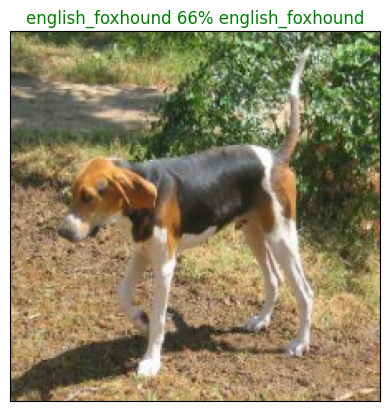

In [ ]:
plot_pred(prediction_probabilites=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This Function will:
* Take an input of prediction porbabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green



In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Find the top 10 prediction confidence INDEXES
    # SIMILAR TO:
    # predictions[0].argsort()[-10:][::-1]   # -1 is for reversing, as we want in descending order
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence VALUES
     # SIMILAR TO:
     # predictions[0].argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction LABELS
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    # if value is present
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


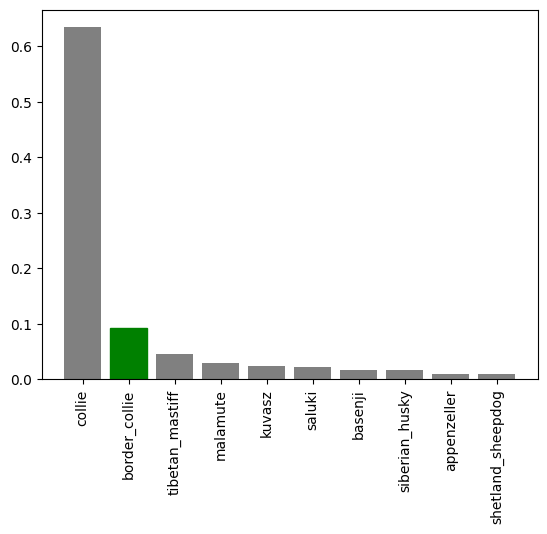

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few

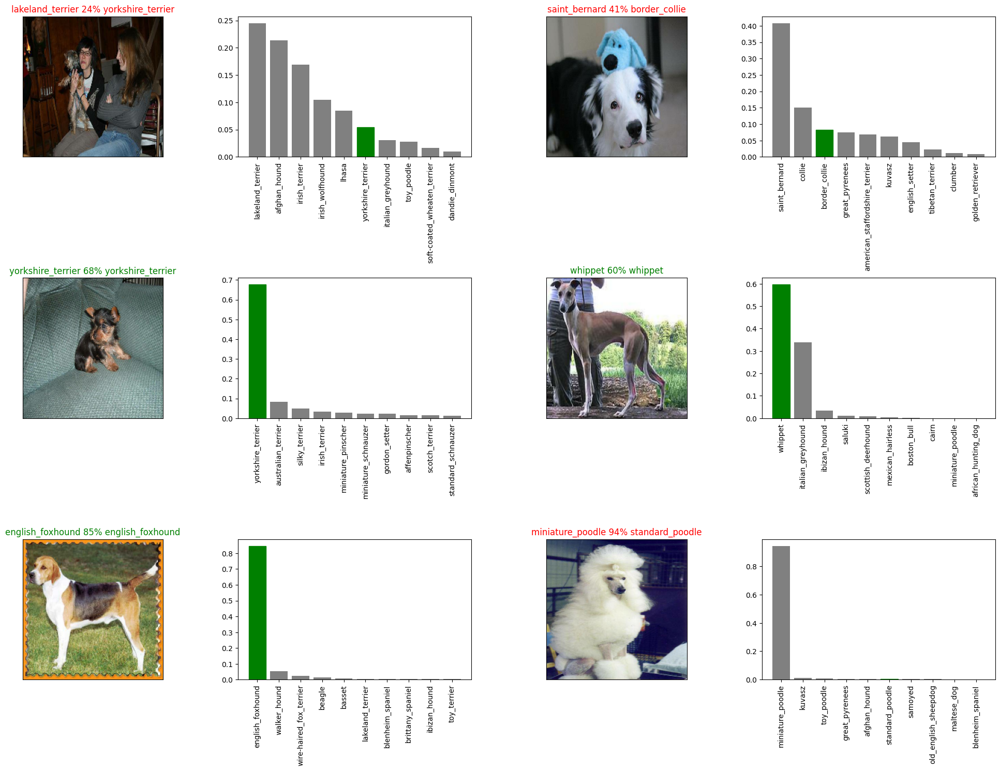

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilites=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

Confusion Matrix is comparing the Predicted labels to True labels and then seeing the which ones the model gets confused

**Challenge:** How would you create a confusion matrix with out models predictions and true labels

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a model's directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# create a funciton to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog Vision/models/20230831-16211693498916-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230831-16211693498916-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20230831-11051693479910-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20230831-11051693479910-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 84ms/step - loss: 1.2411 - accuracy: 0.6900


[1.241100788116455, 0.6899999976158142]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 83ms/step - loss: 1.2830 - accuracy: 0.6600


[1.2829784154891968, 0.6600000262260437]

## Training a Big Dog Model (on the Full Dataset)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
# The tensorflow callback helps us track the performance of our model and compare it to others
full_model_tensorboard = create_tensorboard_callback()
# NO validation set when trainign on al the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (approx 1 hr) becz the GPU we're using in the runtime has to load all of the 10000 images into memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])
# It is going to train for a 100 EPOCHS, but if it stops improving we've got our full model early stopping callback that stops training early and then we can check the results using tensorboard after it is finished


Epoch 1/100
320/320 [==============================] - 41s 117ms/step - loss: 1.3333 - accuracy: 0.6644
Epoch 2/100
320/320 [==============================] - 34s 106ms/step - loss: 0.4011 - accuracy: 0.8821
Epoch 3/100
320/320 [==============================] - 34s 105ms/step - loss: 0.2394 - accuracy: 0.9366
Epoch 4/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1546 - accuracy: 0.9630
Epoch 5/100
320/320 [==============================] - 34s 108ms/step - loss: 0.1059 - accuracy: 0.9794
Epoch 6/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0773 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0583 - accuracy: 0.9929
Epoch 8/100
320/320 [==============================] - 35s 111ms/step - loss: 0.0460 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0373 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 35s 110m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog Vision/models/20230831-16331693499593-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20230831-16331693499593-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/20230831-15401693496426-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20230831-15401693496426-full-image-set-mobilenetv2-Adam.h5


## Making Predictions on Test Dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test daya, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't ahve labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test images filenames
test_path = "drive/MyDrive/Dog Vision/test/"
# fname --> filename
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e5b8269cbd9b417dd00e8661206b91ff.jpg',
 'drive/MyDrive/Dog Vision/test/e6e1e02b07347a522f96eba87d29a5c0.jpg',
 'drive/MyDrive/Dog Vision/test/e60df508ef9f70f9c556003827827234.jpg',
 'drive/MyDrive/Dog Vision/test/e176e183224bc71ce64edb44cb94688e.jpg',
 'drive/MyDrive/Dog Vision/test/e2b808864a5253fd356a9032915447a1.jpg',
 'drive/MyDrive/Dog Vision/test/e6920cc0fd2e3099506d23761d9682e1.jpg',
 'drive/MyDrive/Dog Vision/test/e17defebd1b8fc39e9c3c10df3c2e3de.jpg',
 'drive/MyDrive/Dog Vision/test/e6926a5046cd957245918c33985bcd62.jpg',
 'drive/MyDrive/Dog Vision/test/e458d6133dd1b436b047f86910f7fe34.jpg',
 'drive/MyDrive/Dog Vision/test/e57fded38af2f081403feefb324ed3a9.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an hour)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 35s 109ms/step


In [ ]:
## Assuming above process completed 1 hr
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.05001238e-10, 1.81671815e-08, 9.39115660e-11, ...,
        5.10059328e-09, 2.30327851e-06, 1.78549409e-09],
       [2.28092489e-07, 1.38250718e-08, 1.49372656e-08, ...,
        4.89693366e-06, 8.22532353e-09, 9.31598620e-08],
       [1.05633150e-11, 2.62550433e-11, 5.14522398e-08, ...,
        1.28316441e-10, 4.49887835e-11, 1.42019134e-08],
       ...,
       [7.73088061e-07, 7.00997680e-06, 3.29261285e-09, ...,
        8.45345980e-08, 2.48224329e-04, 6.79194363e-06],
       [1.32983439e-06, 1.24507596e-06, 1.27123978e-09, ...,
        3.15334354e-08, 6.03205876e-07, 3.63845238e-08],
       [1.71575455e-13, 2.40222881e-13, 9.72484853e-12, ...,
        9.99976873e-01, 1.68556561e-13, 7.30768256e-14]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a Dataframe with an ID and a column for each different dog breed.
https://www.kaggle.com/competitions/dog-breed-identification/overview

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID columns as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# ["id"]+list(unique_breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predicitons DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
# test_ids
preds_df["id"] = test_ids

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog Vision/test/e5b8269cbd9b417dd00e8661206b91ff', '.jpg')

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5b8269cbd9b417dd00e8661206b91ff,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e6e1e02b07347a522f96eba87d29a5c0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e60df508ef9f70f9c556003827827234,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e176e183224bc71ce64edb44cb94688e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e2b808864a5253fd356a9032915447a1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# add the predicition probabilites to each dog breed columns
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5b8269cbd9b417dd00e8661206b91ff,2.050012e-10,1.816718e-08,9.391157e-11,1.886970e-08,1.199226e-08,3.583667e-13,1.124665e-10,2.666688e-09,4.404389e-09,...,4.227784e-08,1.065604e-10,1.295776e-10,9.561916e-09,1.803781e-08,2.287253e-12,2.044041e-08,5.100593e-09,2.303279e-06,1.785494e-09
1,e6e1e02b07347a522f96eba87d29a5c0,2.280925e-07,1.382507e-08,1.493727e-08,8.831169e-09,3.828989e-04,1.102959e-07,2.372748e-11,6.000778e-09,1.082392e-07,...,4.300510e-07,1.525912e-07,7.783099e-08,1.107911e-08,2.503378e-04,1.413668e-09,1.886450e-09,4.896934e-06,8.225324e-09,9.315986e-08
2,e60df508ef9f70f9c556003827827234,1.056331e-11,2.625504e-11,5.145224e-08,2.946534e-11,9.709642e-14,4.511059e-09,3.127689e-09,4.370751e-09,1.419032e-09,...,3.192413e-13,5.682220e-09,4.841275e-09,1.722500e-07,2.287043e-10,2.254982e-09,2.276523e-07,1.283164e-10,4.498878e-11,1.420191e-08
3,e176e183224bc71ce64edb44cb94688e,4.027417e-07,4.043261e-09,4.607669e-09,7.170191e-07,5.928055e-09,1.359061e-07,1.580053e-10,1.544548e-09,1.514067e-09,...,4.375341e-07,4.746060e-09,6.323506e-08,5.069258e-09,3.617360e-07,1.779155e-08,1.229657e-08,4.181845e-09,4.487303e-09,1.796540e-08
4,e2b808864a5253fd356a9032915447a1,1.430221e-08,4.408053e-05,5.031930e-08,5.256684e-09,1.512218e-10,2.747726e-04,9.506964e-08,3.300258e-05,2.239558e-07,...,3.414133e-07,1.718092e-07,2.109742e-08,9.179455e-07,4.965060e-08,1.805624e-09,1.176160e-08,2.248466e-04,4.357947e-08,7.261170e-08


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on Custom Images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom iamges won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to uor model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/dog-photo-2.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog-photo-1.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/dog-photo-3.jpeg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds

array([[3.45371010e-10, 8.33254743e-10, 1.05652587e-09, 1.24229141e-10,
        6.05755031e-06, 4.48560855e-10, 1.94734048e-06, 1.47738438e-05,
        1.49944185e-06, 1.26835424e-04, 2.43032616e-07, 7.51406489e-12,
        6.44448037e-11, 8.46330922e-11, 1.30155343e-07, 3.69255027e-09,
        8.02526268e-10, 1.10036744e-05, 4.07316875e-10, 3.92812644e-10,
        2.33553343e-10, 5.81647335e-08, 1.29721741e-07, 1.75582465e-11,
        8.15290591e-09, 3.39486633e-07, 2.35057414e-08, 1.28492536e-06,
        1.78068106e-07, 4.58009672e-05, 4.21886170e-08, 7.73952603e-12,
        3.43255088e-04, 9.33311317e-10, 5.10612743e-08, 6.94507740e-09,
        8.01898936e-10, 4.54724795e-06, 8.31463842e-10, 1.77860286e-08,
        1.49824245e-06, 2.28476601e-05, 4.41447351e-10, 1.80148493e-06,
        9.20298433e-08, 7.38950064e-07, 1.13591886e-10, 2.13402629e-08,
        5.54016999e-10, 9.07989889e-02, 4.64343066e-06, 1.93255642e-06,
        4.83322253e-08, 2.81401480e-08, 3.60782715e-15, 8.790874

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['lakeland_terrier', 'golden_retriever', 'labrador_retriever']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels.. maybe we could fix this later)
# an empty list to unbatchify into..
custom_images= []
# Loop through unbatched data - to turn the custom data set into in iterator
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

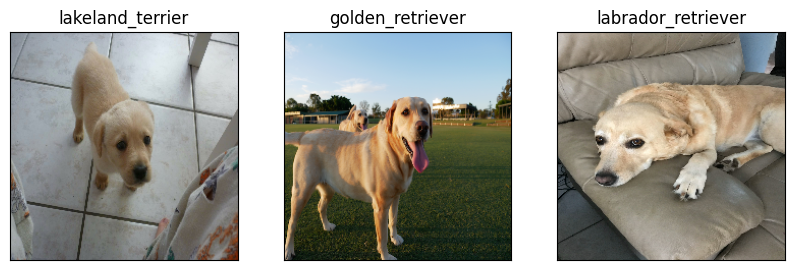

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)